In [1]:
import os
import re
from pathlib import Path
import yaml

import anndata
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import scanpy as sc
import pandas as pd

In [2]:
import matplotlib as mpl
mpl.rcParams['pdf.fonttype'] = 42
plt.rcParams['svg.fonttype'] = 'none'

In [3]:
%load_ext autoreload

In [4]:
%autoreload 2

In [5]:
import mushroom.utils as utils
import mushroom.visualization.utils as vis_utils
from mushroom.mushroom import Mushroom

HT206B1 batches

- 1, 9, 17
- 8, 16, 24

In [6]:
case = 'HT206B1'

In [7]:
project_dir = '/data/estorrs/mushroom/data/projects/submission_v1'
output_dir = os.path.join(project_dir, case, 'xenium_cell_typing')
Path(output_dir).mkdir(parents=True, exist_ok=True)

In [8]:
def alter_filesystem(config, source_root, target_root):
    for entry in config['sections']:
        for mapping in entry['data']:
            mapping['filepath'] = mapping['filepath'].replace(source_root, target_root)
    
    if 'trainer_kwargs' in config and config['trainer_kwargs']['data_mask'] is not None:
        config['trainer_kwargs']['data_mask'] = config['trainer_kwargs']['data_mask'].replace(source_root, target_root)
        
    return config

source_root = '/diskmnt/Projects/Users/estorrs/mushroom/data'
target_root = '/data/estorrs/mushroom/data'

In [9]:
sections = yaml.safe_load(open(os.path.join(project_dir, case, 'mushroom_50res', 'config.yaml')))['sections']
sections

[{'data': [{'dtype': 'xenium',
    'filepath': '/data/estorrs/mushroom/data/projects/submission_v1/HT206B1/registered/s0_HT206B1-U1_xenium.h5ad'}],
  'position': 0,
  'sid': 'HT206B1-U1'},
 {'data': [{'dtype': 'multiplex',
    'filepath': '/data/estorrs/mushroom/data/projects/submission_v1/HT206B1/registered/s1_HT206B1-U2_multiplex.ome.tiff'}],
  'position': 5,
  'sid': 'HT206B1-U2'},
 {'data': [{'dtype': 'he',
    'filepath': '/data/estorrs/mushroom/data/projects/submission_v1/HT206B1/registered/s2_HT206B1-U4_he.tif'}],
  'position': 15,
  'sid': 'HT206B1-U4'},
 {'data': [{'dtype': 'multiplex',
    'filepath': '/data/estorrs/mushroom/data/projects/submission_v1/HT206B1/registered/s3_HT206B1-U5_multiplex.ome.tiff'}],
  'position': 20,
  'sid': 'HT206B1-U5'},
 {'data': [{'dtype': 'xenium',
    'filepath': '/data/estorrs/mushroom/data/projects/submission_v1/HT206B1/registered/s4_HT206B1-U8_xenium.h5ad'}],
  'position': 40,
  'sid': 'HT206B1-U8'},
 {'data': [{'dtype': 'xenium',
    'filep

In [10]:
uids = ['U8', 'U16', 'U24']
sid_to_fps = {}
for entry in sections:
    uid = entry['sid'].split('-')[-1]
    for mapping in entry['data']:
        if mapping['dtype'] == 'xenium' and uid in uids:
            sid_to_fps[entry['sid']] = mapping['filepath']
sid_to_fps

{'HT206B1-U8': '/data/estorrs/mushroom/data/projects/submission_v1/HT206B1/registered/s4_HT206B1-U8_xenium.h5ad',
 'HT206B1-U16': '/data/estorrs/mushroom/data/projects/submission_v1/HT206B1/registered/s9_HT206B1-U16_xenium.h5ad',
 'HT206B1-U24': '/data/estorrs/mushroom/data/projects/submission_v1/HT206B1/registered/s14_HT206B1-U24_xenium.h5ad'}

In [11]:
sid_to_adata = {}
for sid, fp in sid_to_fps.items():
    a = sc.read_h5ad(fp) 
    a.obs['sid'] = sid
    a.obs.index = [f'{sid}_{x}' for x in a.obs.index.to_list()]
    sid_to_adata[sid] = a

In [12]:
adata = anndata.concat(sid_to_adata.values())
adata

AnnData object with n_obs × n_vars = 354162 × 377
    obs: 'x_centroid', 'y_centroid', 'transcript_counts', 'control_probe_counts', 'control_codeword_counts', 'unassigned_codeword_counts', 'deprecated_codeword_counts', 'total_counts', 'cell_area', 'nucleus_area', 'sid'
    obsm: 'spatial', 'spatial_original'

In [13]:
sc.pp.filter_cells(adata, min_counts=10)
sc.pp.filter_genes(adata, min_cells=5)
adata

AnnData object with n_obs × n_vars = 347168 × 377
    obs: 'x_centroid', 'y_centroid', 'transcript_counts', 'control_probe_counts', 'control_codeword_counts', 'unassigned_codeword_counts', 'deprecated_codeword_counts', 'total_counts', 'cell_area', 'nucleus_area', 'sid', 'n_counts'
    var: 'n_cells'
    obsm: 'spatial', 'spatial_original'

In [14]:
adata.layers["counts"] = adata.X.copy()
sc.pp.normalize_total(adata, inplace=True)
sc.pp.log1p(adata)
sc.pp.pca(adata)
sc.pp.neighbors(adata)
sc.tl.umap(adata)

In [15]:
sc.tl.leiden(adata, resolution=2.)

/data/estorrs/miniconda3/envs/mushroom/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


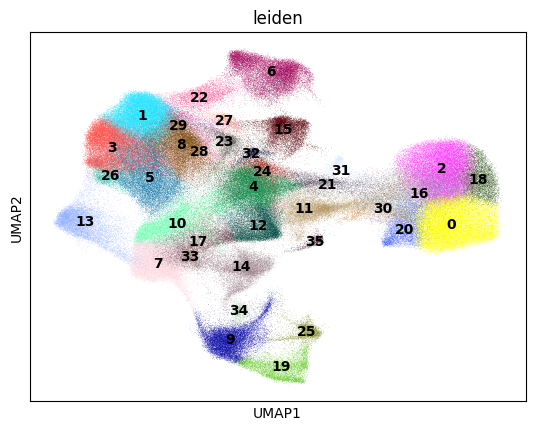

In [17]:
sc.pl.umap(adata, color=['leiden'], legend_loc='on data')

In [37]:
# mapping = {
#     'NK/T_cell': [27, 11, 16, 4, 0, 12],
#     'B_cell': [24],
#     'Macrophage': [6, 5],
#     'Epithelial': [1, 3, 22, 18, 9],
#     'Endothelial': [8, 21],
#     'Fibroblast': [13, 2, 15, 20, 26, 19],
#     'Normal Duct': [10, 23, 29, 28],
#     'pDC': [17],
#     'cDC': [25],
#     'Plasma': [14],
#     'Adipocyte': [30],
#     'Unlabeled': [31, 7],
# }

mapping = {
    'NK/T_cell': [1, 3, 26, 5, 8, 28, 29],
    'B_cell': [23],
    'Macrophage': [12, 4, 21],
    'Epithelial': [0, 20, 30, 16, 2, 18],
    'Endothelial': [6, 22],
    'Fibroblast': [14, 33, 7, 10, 17, 31],
    'Normal Duct': [9, 19, 25, 34],
    'pDC': [15],
    'cDC': [27],
    'Plasma': [13],
    'Adipocyte': [],
    'Unlabeled': [11],
}

r_mapping = {v:k for k, vs in mapping.items() for v in vs}
adata.obs['cell_type'] = [r_mapping.get(int(x), f'cluster {x}') for x in adata.obs['leiden'].to_list()]

/data/estorrs/miniconda3/envs/mushroom/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


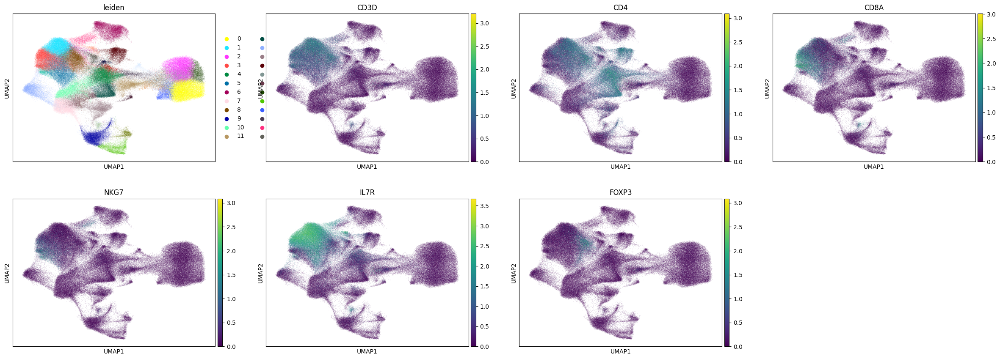

In [18]:
sc.pl.umap(adata, color=['leiden', 'CD3D', 'CD4', 'CD8A', 'NKG7', 'IL7R', 'FOXP3'])

/data/estorrs/miniconda3/envs/mushroom/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


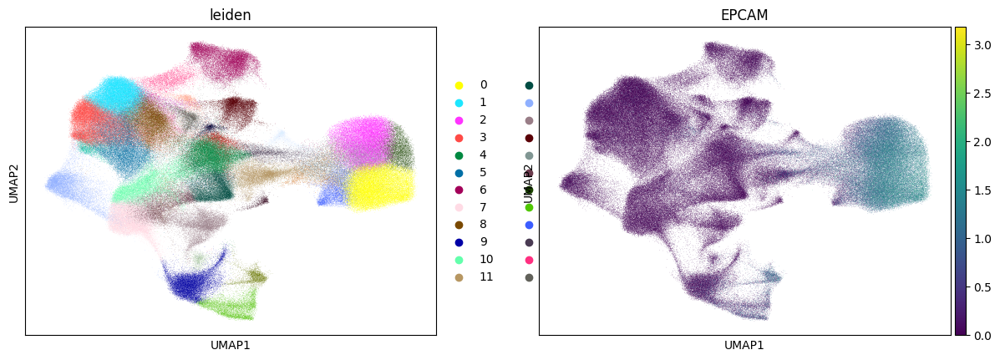

In [19]:
sc.pl.umap(adata, color=['leiden', 'EPCAM'])

In [20]:
[x for x in adata.var.index if 'COL' in x]

['COL17A1', 'COL5A2', 'PCOLCE']

/data/estorrs/miniconda3/envs/mushroom/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


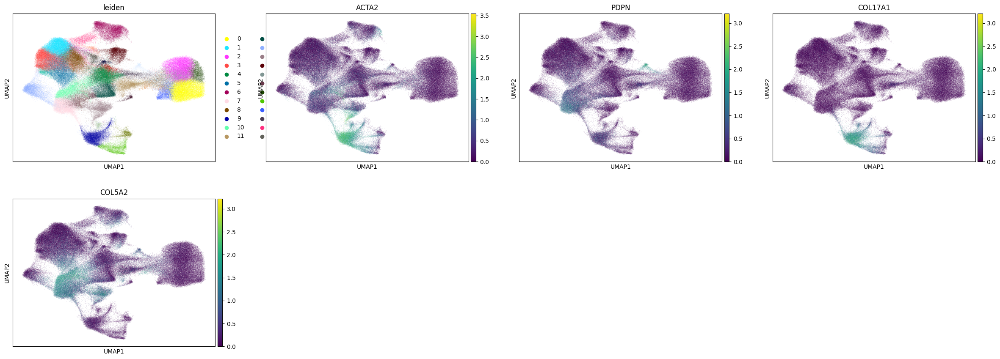

In [23]:
# sc.pl.umap(adata, color=['leiden', 'ACTA2', 'FN1', 'PDPN', 'VIM', 'COL17A1', 'COL5A2'])
sc.pl.umap(adata, color=['leiden', 'ACTA2', 'PDPN', 'COL17A1', 'COL5A2'])

/data/estorrs/miniconda3/envs/mushroom/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


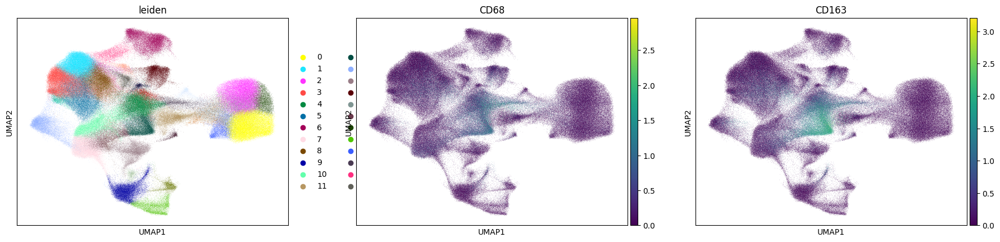

In [24]:
sc.pl.umap(adata, color=['leiden', 'CD68', 'CD163'])

/data/estorrs/miniconda3/envs/mushroom/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


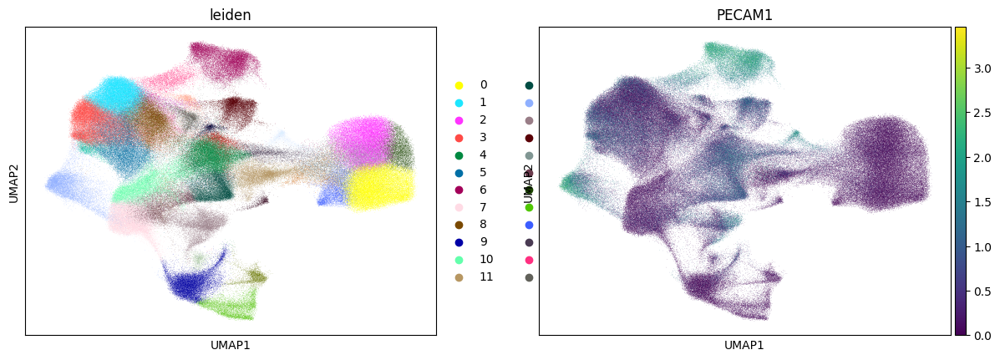

In [25]:
sc.pl.umap(adata, color=['leiden', 'PECAM1'])

/data/estorrs/miniconda3/envs/mushroom/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


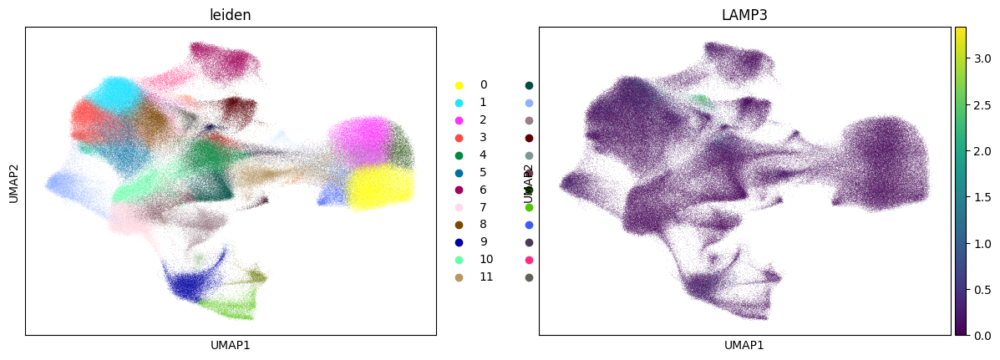

In [27]:
sc.pl.umap(adata, color=['leiden', 'LAMP3'])

/data/estorrs/miniconda3/envs/mushroom/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


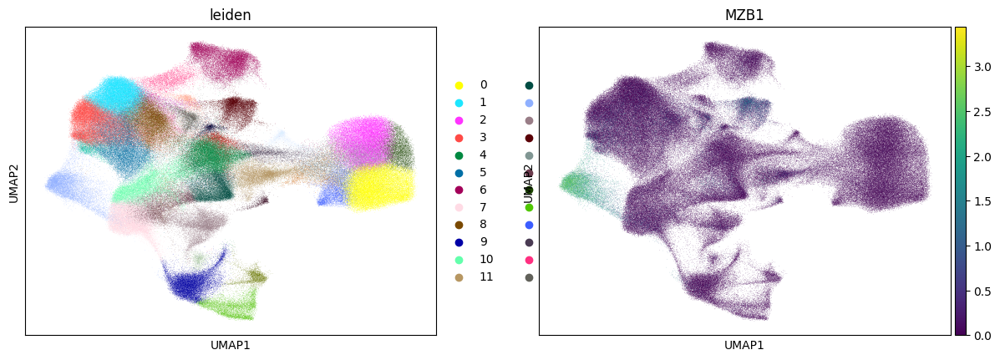

In [28]:
sc.pl.umap(adata, color=['leiden', 'MZB1'])

/data/estorrs/miniconda3/envs/mushroom/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


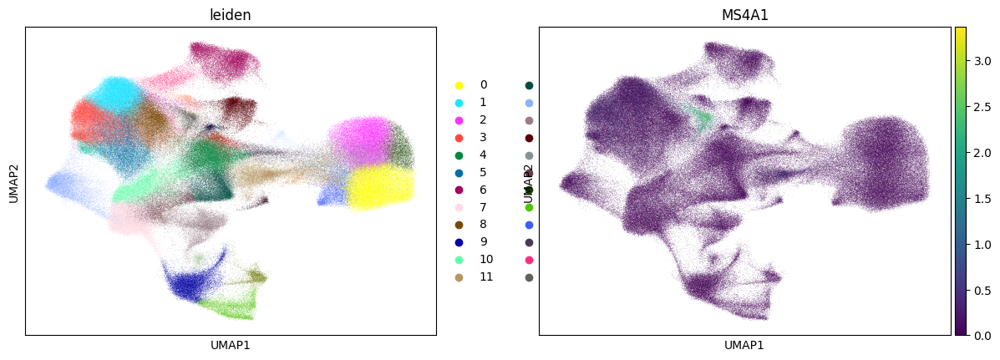

In [29]:
sc.pl.umap(adata, color=['leiden', 'MS4A1'])

/data/estorrs/miniconda3/envs/mushroom/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


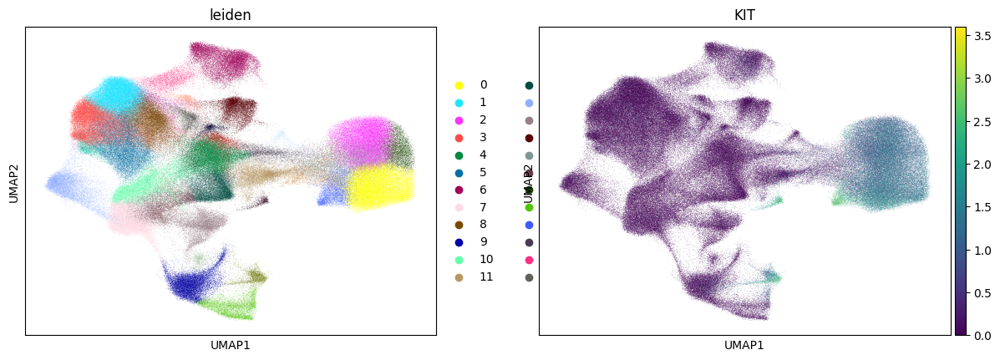

In [30]:
sc.pl.umap(adata, color=['leiden', 'KIT'])

/data/estorrs/miniconda3/envs/mushroom/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


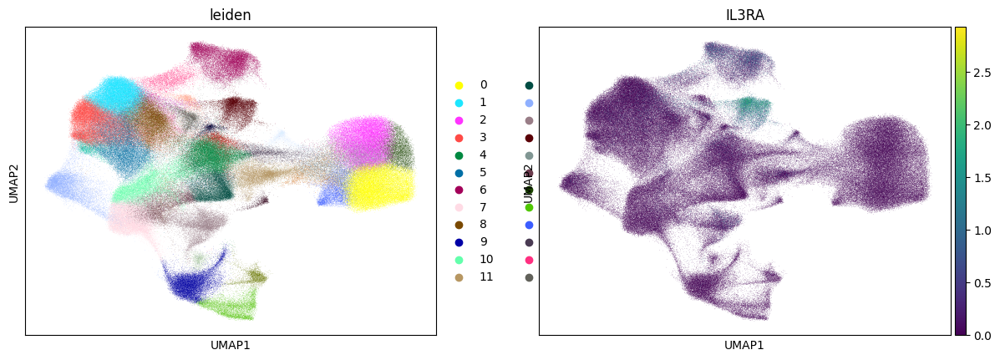

In [31]:
sc.pl.umap(adata, color=['leiden', 'IL3RA'])

/data/estorrs/miniconda3/envs/mushroom/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


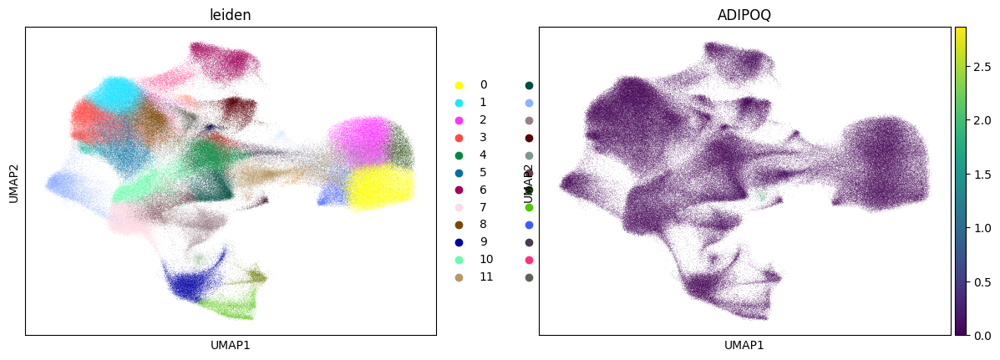

In [32]:
sc.pl.umap(adata, color=['leiden', 'ADIPOQ'])

In [34]:
adata.obs['cell_type_specific'] = adata.obs['cell_type'].to_list()

In [38]:
# save barcodes for test overlay
f = adata[adata.obs['sid']=='HT206B1-U8']
df = f.obs[['cell_type']].copy()
df.index = [x.split('_')[-1] for x in df.index.to_list()]
df.index.name = 'cell_id'
df.columns = ['group']
df


,group
cell_id,
aaaajafh-1,Fibroblast
aaaajlgp-1,Fibroblast
aaabldek-1,Macrophage
aaacgnch-1,Macrophage
aaadiigf-1,Fibroblast
...,...
oibgllom-1,Epithelial
oibgmngp-1,Fibroblast
oibipigi-1,Macrophage


In [39]:
df.to_csv('/data/estorrs/sandbox/HT206B1-U8_celltypes.csv')

In [60]:

f = adata[adata.obs['cell_type']=='NK/T_cell'].copy()
f

AnnData object with n_obs × n_vars = 82220 × 477
    obs: 'x_centroid', 'y_centroid', 'transcript_counts', 'control_probe_counts', 'control_codeword_counts', 'unassigned_codeword_counts', 'deprecated_codeword_counts', 'total_counts', 'cell_area', 'nucleus_area', 'sid', 'n_counts', 'leiden', 'cell_type'
    var: 'n_cells'
    uns: 'log1p', 'pca', 'neighbors', 'umap', 'leiden', 'leiden_colors'
    obsm: 'spatial', 'X_pca', 'X_umap'
    varm: 'PCs'
    layers: 'counts'
    obsp: 'distances', 'connectivities'

In [61]:
sc.pp.pca(f)
sc.pp.neighbors(f)
sc.tl.umap(f)

In [62]:
sc.tl.leiden(f, resolution=2.)

/data/estorrs/miniconda3/envs/mushroom/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


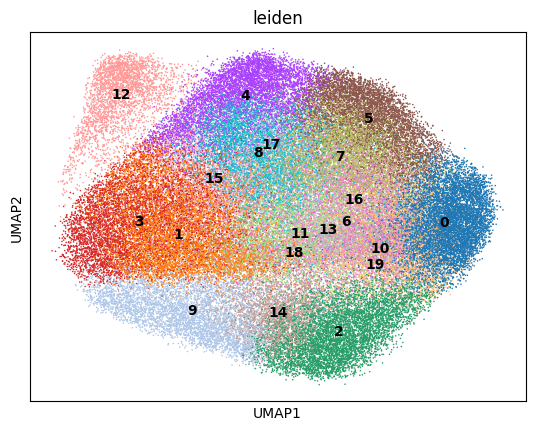

In [66]:
sc.pl.umap(f, color=['leiden'], legend_loc='on data', size=5)

/data/estorrs/miniconda3/envs/mushroom/lib/python3.10/site-packages/anndata/_core/anndata.py:1301: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
... storing 'cell_type' as categorical
/data/estorrs/miniconda3/envs/mushroom/lib/python3.10/site-packages/anndata/_core/anndata.py:1301: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
... storing 'cell_type_specific' as categorical
/data/estorrs/miniconda3/envs/mushroom/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


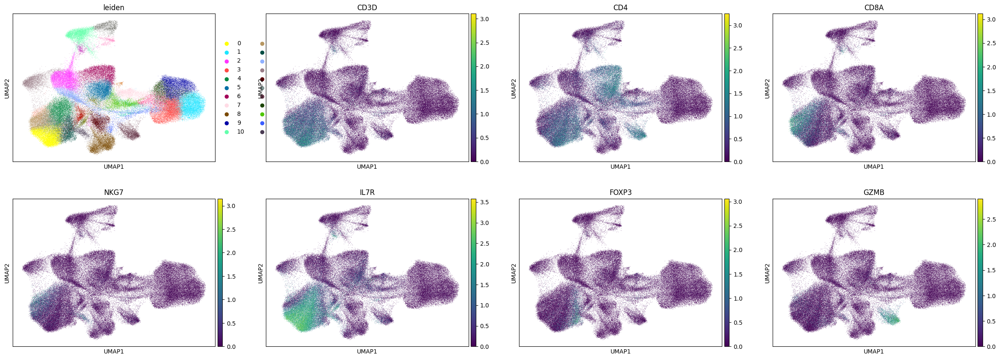

In [71]:
sc.pl.umap(f, color=['leiden', 'CD3D', 'CD4', 'CD8A', 'NKG7', 'IL7R', 'FOXP3', 'GZMB'])

In [68]:
mapping = {
    'CD8 T cells': [3, 4, 5],
    'CD4 T cells': [1, 15, 8, 17, 11, 18, 13, 6, 16, 10, 19, 0, 7],
    'Treg': [9, 14, 2],
    'NK': [12],
}
r_mapping = {v:k for k, vs in mapping.items() for v in vs}
f.obs['cell_type_specific'] = [r_mapping[int(x)] for x in f.obs['leiden'].to_list()]
barcode_to_specific = {k:v for k, v in zip(f.obs.index.to_list(), f.obs['cell_type_specific'])}

In [74]:
adata.obs['cell_type_specific'] = [
    barcode_to_specific.get(x, ct)
    for x, ct in zip(adata.obs.index.to_list(), adata.obs['cell_type_specific'].to_list())]

In [75]:
# save barcodes for test overlay
z = adata[adata.obs['sid']=='HT206B1-U1']
df = z.obs[['cell_type_specific']].copy()
df.index = [x.split('_')[-1] for x in df.index.to_list()]
df.index.name = 'cell_id'
df.columns = ['group']
df.to_csv('/data/estorrs/sandbox/HT206B1-U1_celltypes.csv')

In [82]:
# save barcodes
df = adata.obs[['sid', 'cell_type_specific']].copy()
df['barcode'] = [x.split('_')[-1] for x in df.index.to_list()]
df.index.name = 'cell_id'
df.to_csv(os.path.join(output_dir, 'xenium_cell_types_U1_U9_U17.txt'), sep='\t')

In [83]:
df

,sid,cell_type_specific,barcode
cell_id,,,
HT206B1-U1_aaaaeefm-1,HT206B1-U1,Unlabeled,aaaaeefm-1
HT206B1-U1_aaaagokl-1,HT206B1-U1,Unlabeled,aaaagokl-1
HT206B1-U1_aaaaippd-1,HT206B1-U1,Unlabeled,aaaaippd-1
HT206B1-U1_aaaajeja-1,HT206B1-U1,Unlabeled,aaaajeja-1
HT206B1-U1_aaablpen-1,HT206B1-U1,Unlabeled,aaablpen-1
...,...,...,...
HT206B1-U17_oipdaahd-1,HT206B1-U17,Unlabeled,oipdaahd-1
HT206B1-U17_oipdeoio-1,HT206B1-U17,Unlabeled,oipdeoio-1
HT206B1-U17_oipdjjlh-1,HT206B1-U17,Unlabeled,oipdjjlh-1


In [84]:
set(df['cell_type_specific'])

{'Adipocyte',
 'B_cell',
 'CD4 T cells',
 'CD8 T cells',
 'Endothelial',
 'Epithelial',
 'Fibroblast',
 'Macrophage',
 'NK',
 'Normal Duct',
 'Plasma',
 'Treg',
 'Unlabeled',
 'cDC',
 'pDC'}

In [85]:
# save object
adata.write_h5ad(os.path.join(output_dir, 'cell_typing_obj_U1_U9_U17.h5ad'))

... storing 'cell_type' as categorical
... storing 'cell_type_specific' as categorical
